## Computational Photography
## Duke Kunshan University Fall 2017
### David Brady
Monday 4 December 2017

## Compression




Today we consider the most fundamental aspect of computational photography, conversion from raw image formats to compressed data. Image processing as raw pixel maps requires a lot of memory, computation and communication resources. Images are universally converted to compressed formats at the camera to reduce this load, but this requires additional processing at the display node.  We start by considering the JPEG still image format.  We rely on the description at 

http://arjunsreedharan.org/post/146070390717/jpeg-101-how-does-jpeg-work 
https://en.wikipedia.org/wiki/JPEG 

JPEG compression includes the following steps:

Step 1: Convert RGB to YCbCr color space

YCbCr values can be computed directly from RGB as follows:[1]
Y = 0.299 R + 0.587 G + 0.114 B
Cb = - 0.1687 R - 0.3313 G + 0.5 B + 128
Cr = 0.5 R - 0.4187 G - 0.0813 B + 128

Step 2: Downsampling


Step 3: Use Discrete Cosine Transform (DCT)


Step 4: Quantization



Step 5: Encoding


Step 6: Add Header


In [155]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import subprocess
import skimage
import skimage.io as imio
import skimage.transform as trans
from skimage.viewer import ImageViewer
import glob
from time import gmtime, strftime, sleep
import re
from scipy import interpolate as interp
%matplotlib inline
mpl.rcParams['figure.figsize'] = (16.0, 8.0) 

In [122]:
def grabImage(sid=1, imres=8, fm=1, cameraNumber=6):
    # I will use the file name dbGrab.... for the image grabbed from the camera. First step is to get rid of previously grabbed images
    cmdA='rsh ubuntu@10.0.1.'+str(cameraNumber)
    cmdB='rcp ubuntu@10.0.1.'+str(cameraNumber)
    subprocess.run('rm dbGrab*', \
                   stdout=subprocess.PIPE, shell=True)
    subprocess.run('rm *raw', \
                   stdout=subprocess.PIPE, shell=True)
    subprocess.run(cmdA+' "rm dbGrab*"', \
                   stdout=subprocess.PIPE, shell=True)
    subprocess.run(cmdA+' "rm *.raw"', \
                   stdout=subprocess.PIPE, shell=True)
    # ok, now let's grab an image on the tegra
    cmD=cmdA+' "nvgstcapture-1.0 -m 1 --sensor-id '+str(sid)+' -A --capture-auto 1 --dump-bayer\
                    --file-name dbGrab --image-res '+ str(imres)+'"'
    subprocess.run(cmD, stdout=subprocess.PIPE, shell=True)
    subprocess.run(cmdB+':dbGrab* .', \
                   stdout=subprocess.PIPE, shell=True)
    subprocess.run(cmdB+':*.raw .', \
                   stdout=subprocess.PIPE, shell=True)
    #ok, now let's find the file name of the image we just grabbed and transfered 
    pop=subprocess.run('ls',stdout=subprocess.PIPE, shell=True)
    rePop=pop.stdout
    rePop=rePop.decode("utf-8")
    if fm==1:
        fileName = re.search(r'dbGrab(.*).jpg', rePop)
        fileName=fileName.group()
        pop=imio.imread(fileName)
    else:
        fileName = re.search(r'(.*).raw', rePop)
        fileName=fileName.group()
        pop=np.fromfile(fileName,dtype=np.dtype('i2'))
        pop=pop[250416:]
        pop=np.reshape(pop,(2174,3864))
       # pop=np.append(pop[:,2060:] ,pop[:,:2060],axis=1)
    return pop

In [326]:
def demosaic(rawImage):
    red=rawImage[0:2174:2,1:3864:2]
    redU=interp.RectBivariateSpline(np.arange(0,1087),np.arange(0,1932),red)
    red=redU(np.arange(0,1087,.5),np.arange(0,1932,.5))
    red=np.append(red[:,744:] ,red[:,:744],axis=1)
    blue=rawImage[1:2174:2,0:3864:2]
    blueU=interp.RectBivariateSpline(np.arange(0,1087),np.arange(0,1932),blue)
    blue=blueU(np.arange(0,1087,.5),np.arange(0,1932,.5))
    blue=np.append(blue[:,744:] ,blue[:,:744],axis=1)
    green=rawImage;
    for er in range(1,2173,2):
        for odr in range(0,3862,2):
            green[er,odr]=np.mean([green[er-1,odr], green[er,odr-1],green[er+1,odr], green[er,odr+1]])
    for er in range(0,2172,2):
        for odr in range(1,3861,2):
            green[er,odr]=np.mean([green[er-1,odr], green[er,odr-1],green[er+1,odr], green[er,odr+1]])
    green=np.append(green[:,744:] ,green[:,:744],axis=1)
    imageOut=np.dstack((blue,green,red))
    imageOut=255*imageOut/np.max(imageOut)
    imageOut=imageOut.astype(np.uint8)
    return imageOut

In [105]:
def adjustColor(inputImage,rc=1,bc=1,gc=1,gain=1,contrast=1):
    fI=inputImage.astype(np.float)
    fI[:,:,0]=rc*fI[:,:,0]
    fI[:,:,1]=gc*fI[:,:,1]
    fI[:,:,2]=bc*fI[:,:,2]
    fI=gain*fI/np.max(fI)
    fI=255*np.tanh(contrast*fI)
    fI=fI.astype(np.uint8)
    return fI

In [281]:
def RawPixelSamples(sid=1, imres=8, cameraNumber=6, frames=100, samplePixels=10000):
    cmdA='rsh ubuntu@10.0.1.'+str(cameraNumber)
    cmdB='rcp ubuntu@10.0.1.'+str(cameraNumber)
    pixels=np.random.randint(250416,2160*3840,samplePixels)
    subprocess.run('rm dbGrab*', \
                   stdout=subprocess.PIPE, shell=True)
    subprocess.run('rm *raw', \
                   stdout=subprocess.PIPE, shell=True)
    subprocess.run(cmdA+' "rm dbGrab*"', \
                   stdout=subprocess.PIPE, shell=True)
    subprocess.run(cmdA+' "rm *.raw"', \
                   stdout=subprocess.PIPE, shell=True)
    # ok, now let's grab some images on the tegra
    cmD=cmdA+' "nvgstcapture-1.0 -m 1 --sensor-id '+str(sid)+' -A --capture-auto -C '+str(frames)+' --dump-bayer\
    --capture-gap 500 --image-res '+ str(imres)+'"'
    subprocess.run(cmD, stdout=subprocess.PIPE, shell=True)
    subprocess.run(cmdB+':*.raw .', \
                   stdout=subprocess.PIPE, shell=True)
    #ok, now let's find the file name of the image we just grabbed and transfered 
    pop=subprocess.run('ls',stdout=subprocess.PIPE, shell=True)
    rePop=pop.stdout
    rePop=rePop.decode("utf-8")
    fileName = re.findall(r'(.*).raw', rePop)
    pop=np.fromfile(fileName[0]+'.raw',dtype=np.dtype('i2'))
    pixelValues=pop[pixels]
    for index in range(1,len(fileName)):
        pop=np.fromfile(fileName[index]+'.raw',dtype=np.dtype('i2'))
        pixelValues=np.vstack((pixelValues,pop[pixels]))
                              
    return pixelValues

In [298]:
a=grabImage(fm=1)

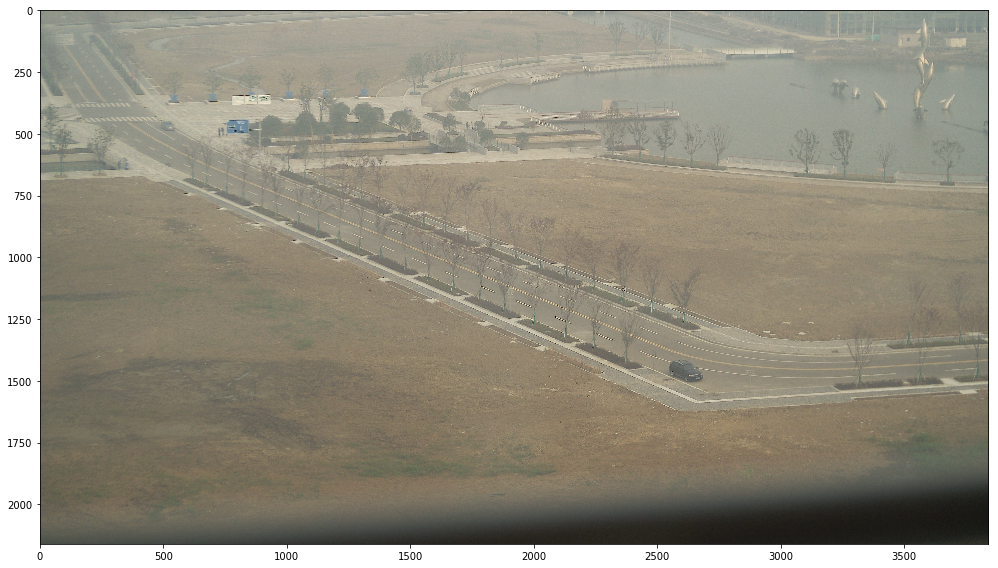

In [299]:
imio.imshow(a)

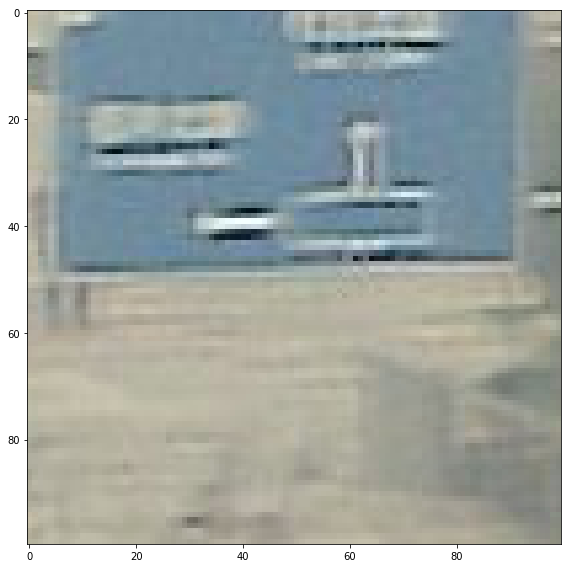

In [301]:
imio.imshow(a[450:550,750:850,:])

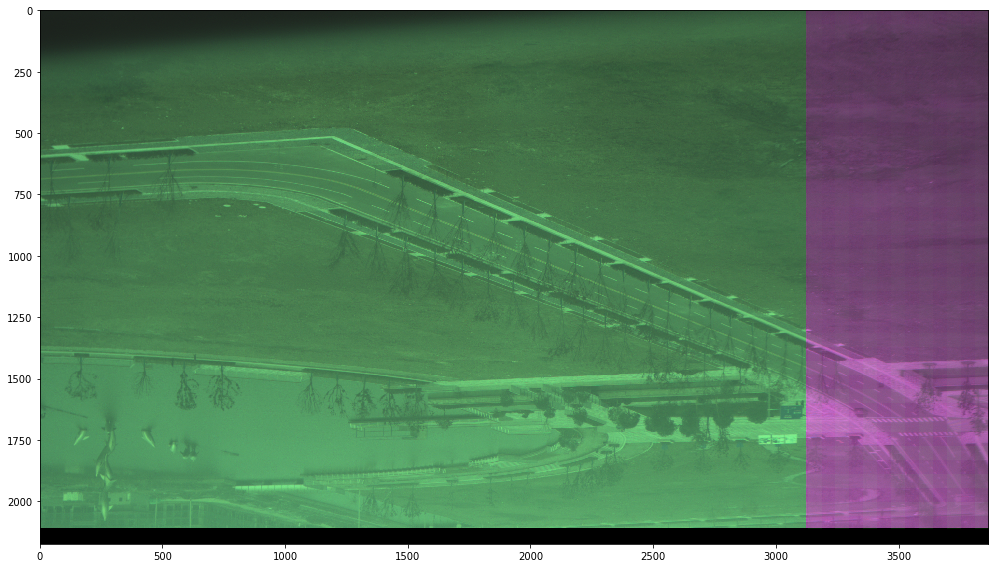

In [327]:
b=grabImage(fm=2)
b=demosaic(b)
imio.imshow(b)

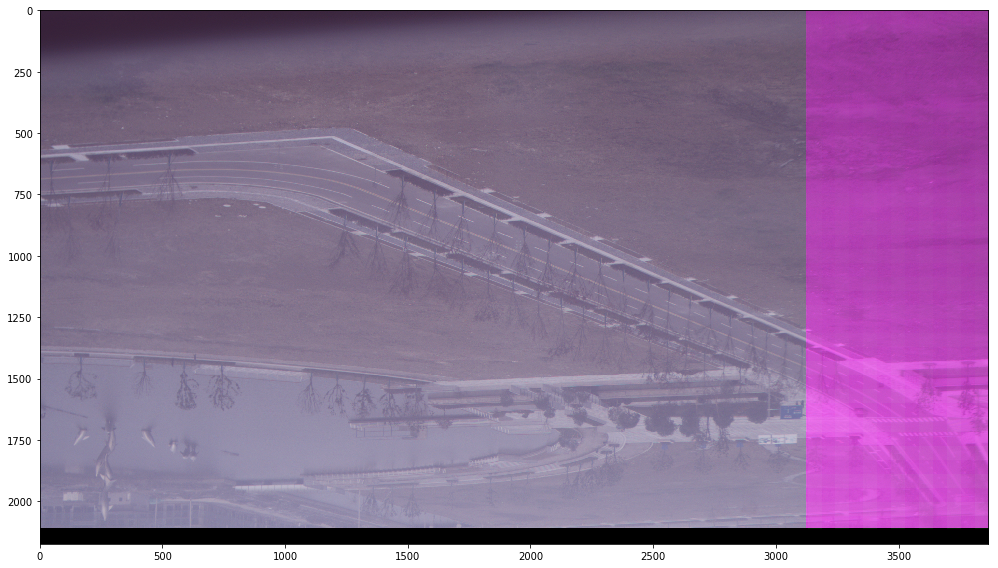

In [329]:
c=adjustColor(b,rc=1.2,bc=1.2,gc=.6,gain=4,contrast=.5)
imio.imshow(c)

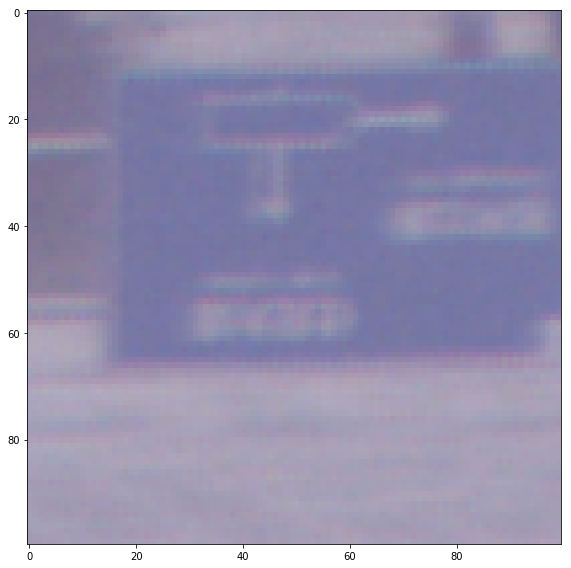

In [330]:
imio.imshow(c[1600:1700,3000:3100,:])

In [350]:
import skimage.color as cp
help(cp.rgb2ycbcr)

Help on function rgb2ycbcr in module skimage.color.colorconv:

rgb2ycbcr(rgb)
    RGB to YCbCr color space conversion.
    
    Parameters
    ----------
    rgb : array_like
        The image in RGB format, in a 3- or 4-D array of shape
        ``(M, N, [P,] 3)``.
    
    Returns
    -------
    out : ndarray
        The image in YCbCr format, in a 3- or 4-D array of shape
        ``(M, N, [P,] 3)``.
    
    Raises
    ------
    ValueError
        If `rgb` is not a 3- or 4-D array of shape ``(M, N, [P,] 3)``.
    
    Notes
    -----
    Y is between 16 and 235.  This is the color space which is commonly used
    by video codecs, it is sometimes incorrectly called "YUV"
    
    References
    ----------
    .. [1] https://en.wikipedia.org/wiki/YCbCr



/home/dbrady/anaconda3/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:77: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  warn("Float image out of standard range; displaying "


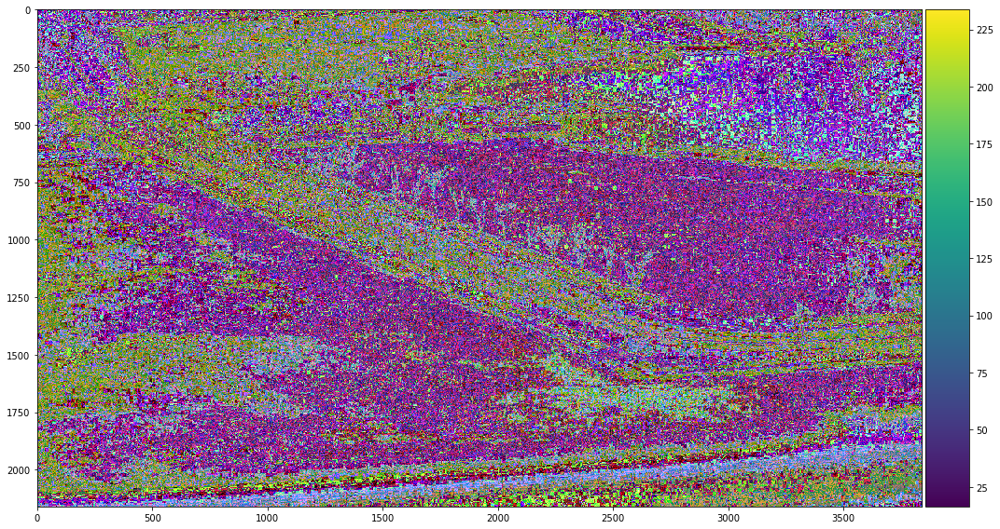

In [351]:
e=cp.rgb2ycbcr(a)
imio.imshow(e)

/home/dbrady/anaconda3/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:77: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  warn("Float image out of standard range; displaying "


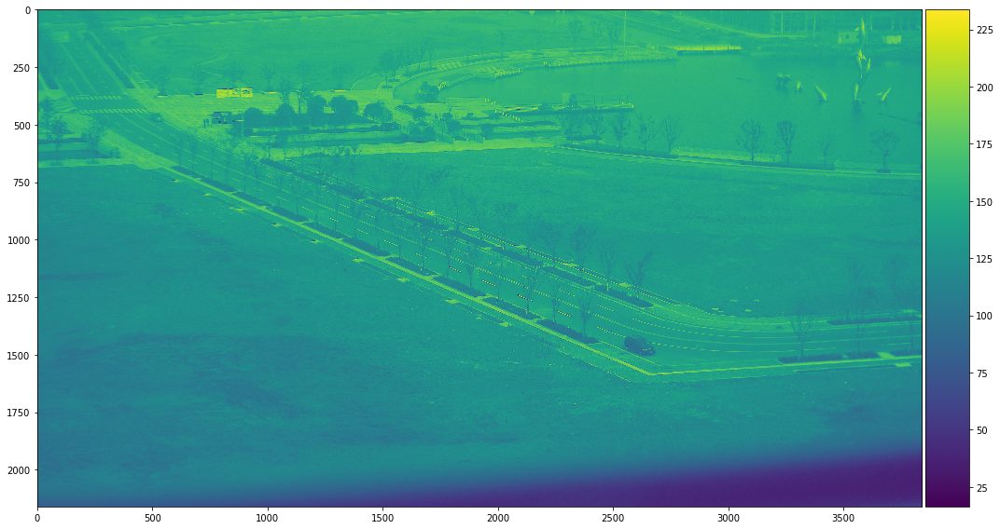

In [361]:
imio.imshow(e[:,:,0])

/home/dbrady/anaconda3/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:77: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  warn("Float image out of standard range; displaying "


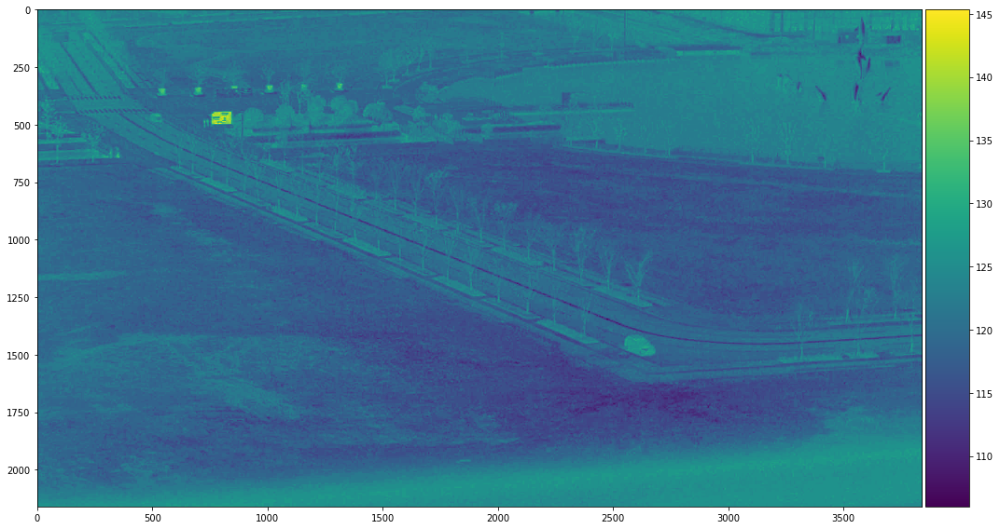

In [362]:
imio.imshow(e[:,:,1])

/home/dbrady/anaconda3/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:77: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  warn("Float image out of standard range; displaying "


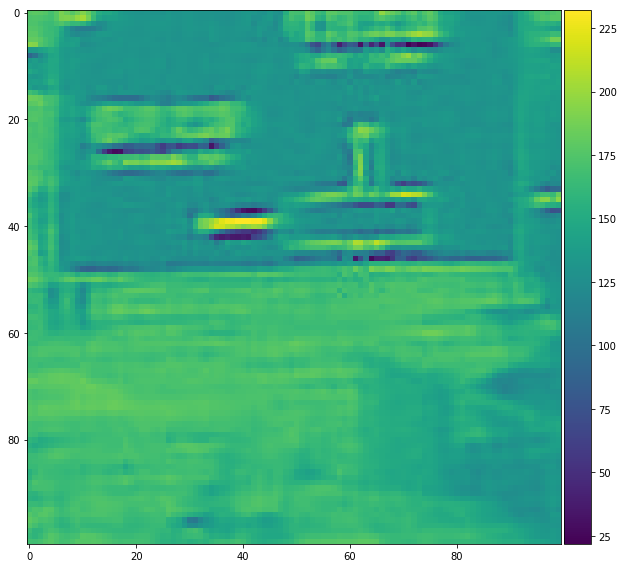

In [360]:
imio.imshow(e[450:550,750:850,0])

/home/dbrady/anaconda3/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:77: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  warn("Float image out of standard range; displaying "


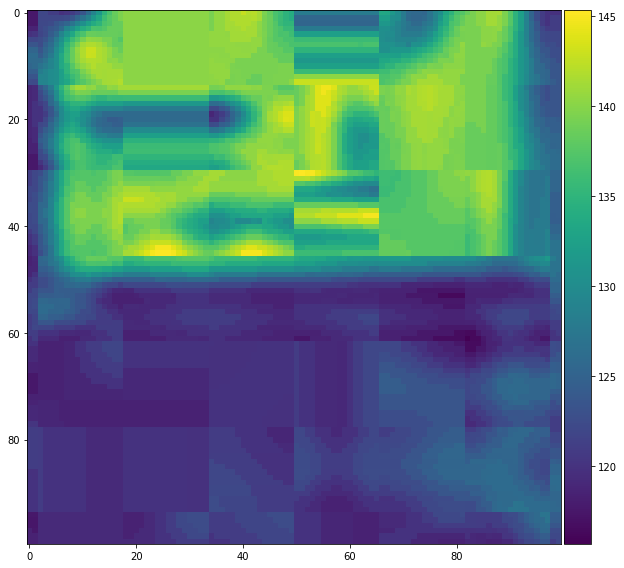

In [363]:
imio.imshow(e[450:550,750:850,1])

/home/dbrady/anaconda3/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:77: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  warn("Float image out of standard range; displaying "


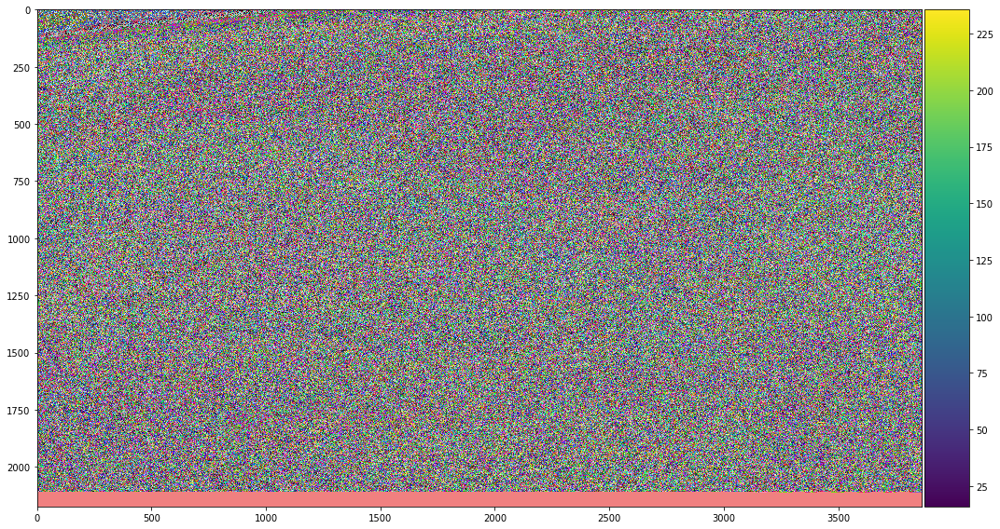

In [365]:
e=cp.rgb2ycbcr(c)
imio.imshow(e)

/home/dbrady/anaconda3/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:77: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  warn("Float image out of standard range; displaying "


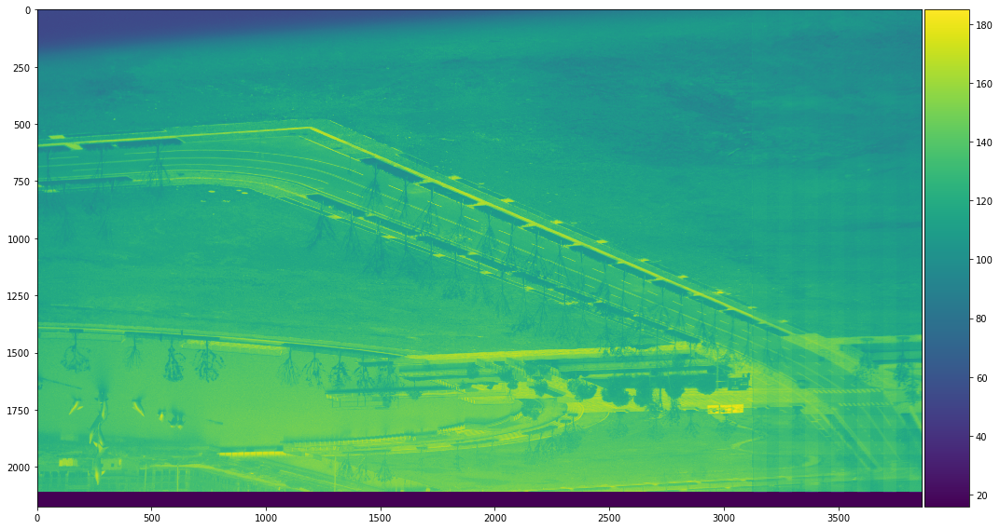

In [366]:
imio.imshow(e[:,:,0])

/home/dbrady/anaconda3/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:77: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  warn("Float image out of standard range; displaying "


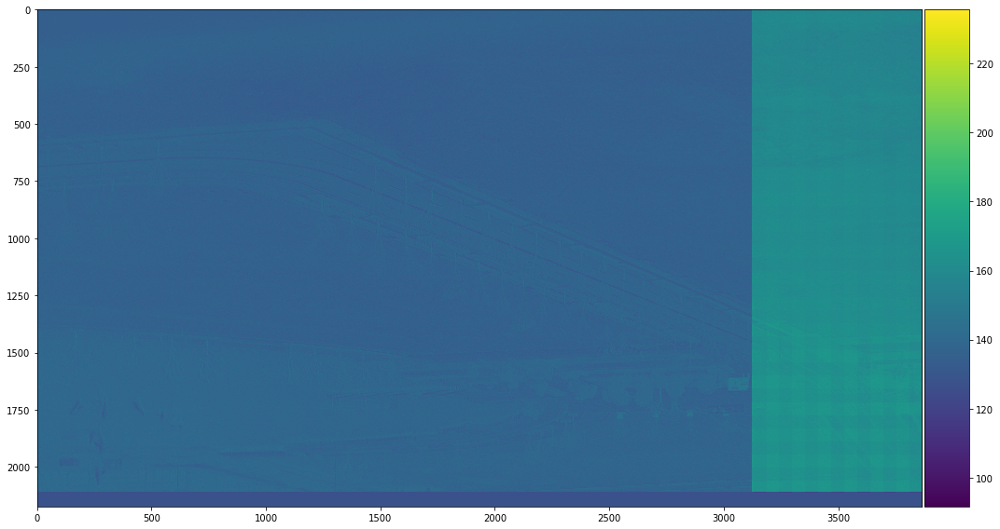

In [367]:
imio.imshow(e[:,:,1])

/home/dbrady/anaconda3/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:77: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  warn("Float image out of standard range; displaying "


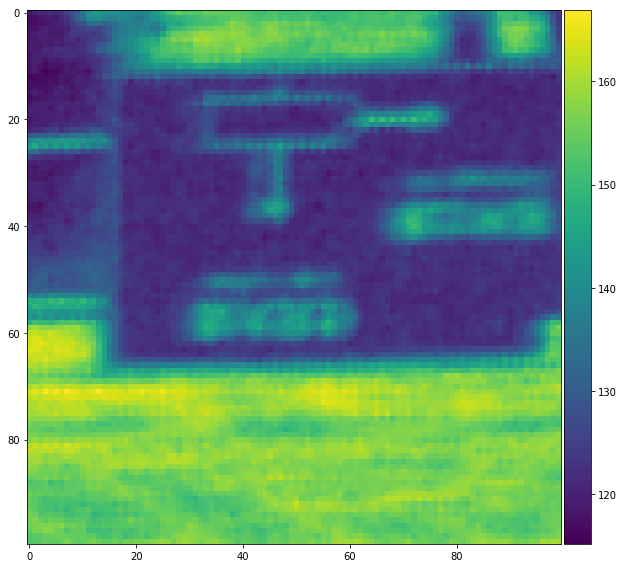

In [370]:
imio.imshow(e[1600:1700,3000:3100,0])

/home/dbrady/anaconda3/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:77: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  warn("Float image out of standard range; displaying "


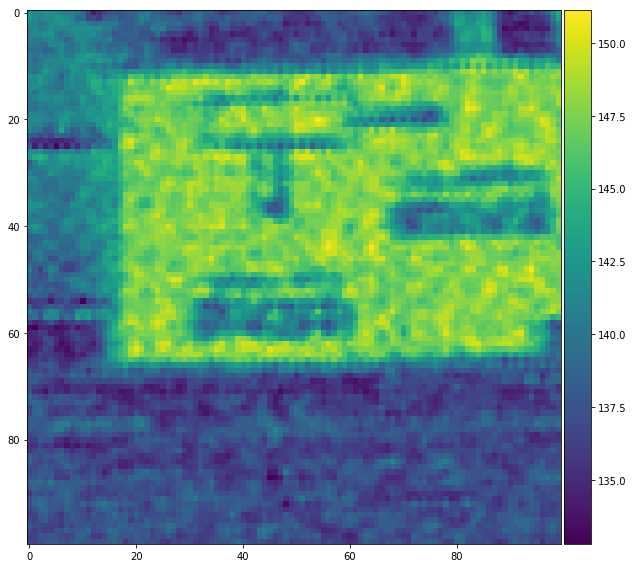

In [371]:
imio.imshow(e[1600:1700,3000:3100,1])

The discrete cosine transform is used to convert to a compressible data space in JPEG

In [372]:
from scipy.fftpack import dct

def dct2D(x):
	tmp = dct(x, type=2 ,norm='ortho').transpose()
	return dct(tmp, type=2 ,norm='ortho').transpose()


In [380]:
block=dct2D(e[1600:1700,3000:3100,0]-128)

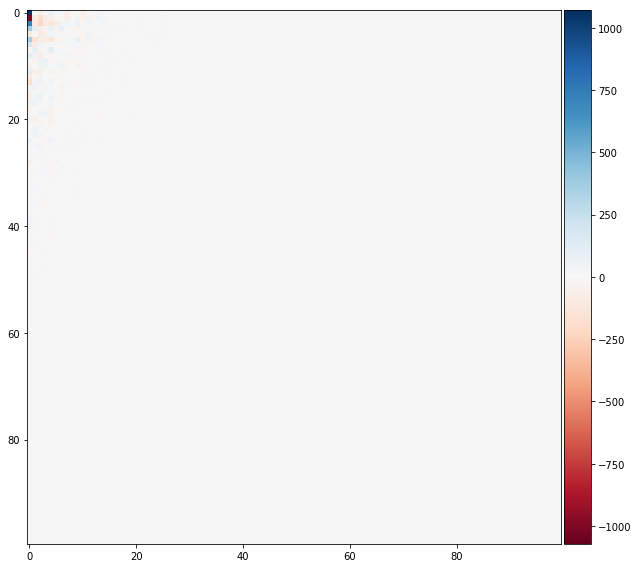

In [381]:
imio.imshow(block)

In [400]:
block=dct2D(e[1600:1608,3000:3008,0]-128)

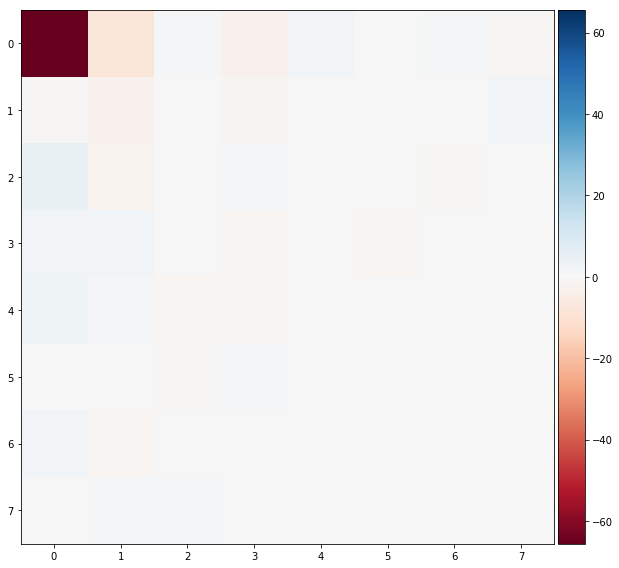

In [401]:
imio.imshow(block)

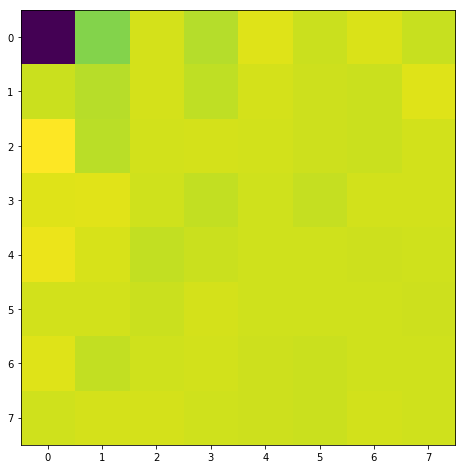

In [402]:
plt.imshow(block)

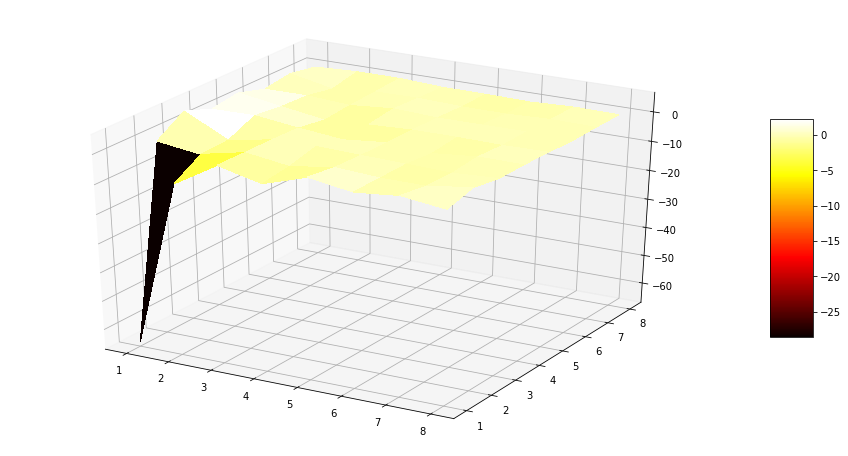

In [403]:

from mpl_toolkits.mplot3d import Axes3D

X = np.arange(1, 9)
Y = np.arange(1, 9)
X, Y = np.meshgrid(X, Y)
fig = plt.figure()
ax = fig.gca(projection='3d')
surf = ax.plot_surface(X, Y, block, rstride=1, cstride=1, cmap='hot', linewidth=0, antialiased=False)

fig.colorbar(surf, shrink=0.5, aspect=5)
plt.show()


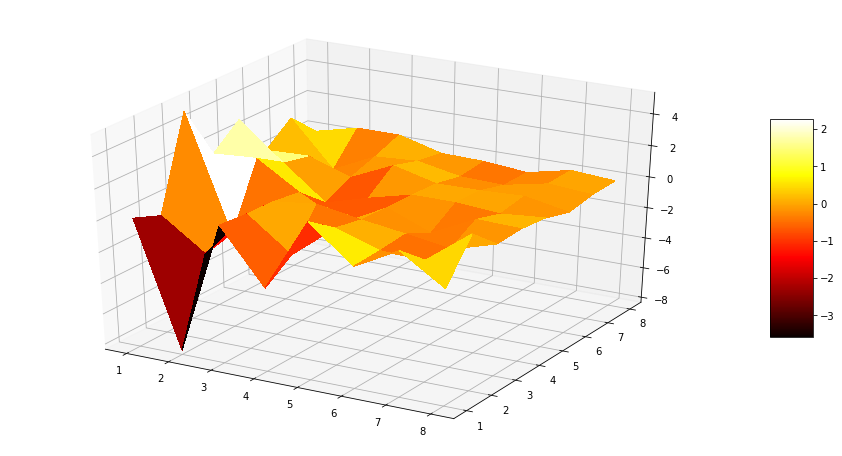

In [404]:
from mpl_toolkits.mplot3d import Axes3D

X = np.arange(1, 9)
Y = np.arange(1, 9)
X, Y = np.meshgrid(X, Y)
fig = plt.figure()
ax = fig.gca(projection='3d')
bl=block
bl[0,0]=0
surf = ax.plot_surface(X, Y, bl, rstride=1, cstride=1, cmap='hot', linewidth=0, antialiased=False)

fig.colorbar(surf, shrink=0.5, aspect=5)
plt.show()

The dct image is compressed using run length encoding and huffman coding
https://en.wikipedia.org/wiki/Run-length_encoding 


In [421]:
from PIL import Image
im = Image.open("dog.jpg")
q=im.quantization

In [430]:
len(q)

2

In [425]:
q.values()

dict_values([array('B', [8, 6, 6, 7, 6, 5, 8, 7, 7, 7, 9, 9, 8, 10, 12, 20, 13, 12, 11, 11, 12, 25, 18, 19, 15, 20, 29, 26, 31, 30, 29, 26, 28, 28, 32, 36, 46, 39, 32, 34, 44, 35, 28, 28, 40, 55, 41, 44, 48, 49, 52, 52, 52, 31, 39, 57, 61, 56, 50, 60, 46, 51, 52, 50]), array('B', [9, 9, 9, 12, 11, 12, 24, 13, 13, 24, 50, 33, 28, 33, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50])])

In [435]:
print(q)

{0: array('B', [8, 6, 6, 7, 6, 5, 8, 7, 7, 7, 9, 9, 8, 10, 12, 20, 13, 12, 11, 11, 12, 25, 18, 19, 15, 20, 29, 26, 31, 30, 29, 26, 28, 28, 32, 36, 46, 39, 32, 34, 44, 35, 28, 28, 40, 55, 41, 44, 48, 49, 52, 52, 52, 31, 39, 57, 61, 56, 50, 60, 46, 51, 52, 50]), 1: array('B', [9, 9, 9, 12, 11, 12, 24, 13, 13, 24, 50, 33, 28, 33, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50])}


In [450]:
tab=np.reshape(q[0],(8,8))
tab

array([[ 8,  6,  6,  7,  6,  5,  8,  7],
       [ 7,  7,  9,  9,  8, 10, 12, 20],
       [13, 12, 11, 11, 12, 25, 18, 19],
       [15, 20, 29, 26, 31, 30, 29, 26],
       [28, 28, 32, 36, 46, 39, 32, 34],
       [44, 35, 28, 28, 40, 55, 41, 44],
       [48, 49, 52, 52, 52, 31, 39, 57],
       [61, 56, 50, 60, 46, 51, 52, 50]], dtype=uint8)

In [451]:
tab=np.reshape(q[1],(8,8))
tab

array([[ 9,  9,  9, 12, 11, 12, 24, 13],
       [13, 24, 50, 33, 28, 33, 50, 50],
       [50, 50, 50, 50, 50, 50, 50, 50],
       [50, 50, 50, 50, 50, 50, 50, 50],
       [50, 50, 50, 50, 50, 50, 50, 50],
       [50, 50, 50, 50, 50, 50, 50, 50],
       [50, 50, 50, 50, 50, 50, 50, 50],
       [50, 50, 50, 50, 50, 50, 50, 50]], dtype=uint8)

In [452]:
from PIL import Image
im = Image.open("dip.jpg")
q=im.quantization

In [453]:
len(q)

2

In [454]:
q.values()

dict_values([array('B', [5, 3, 4, 4, 4, 3, 5, 4, 4, 4, 5, 5, 5, 6, 7, 12, 8, 7, 7, 7, 7, 15, 11, 11, 9, 12, 17, 15, 18, 18, 17, 15, 17, 17, 19, 22, 28, 23, 19, 20, 26, 21, 17, 17, 24, 33, 24, 26, 29, 29, 31, 31, 31, 19, 23, 34, 36, 34, 30, 36, 28, 30, 31, 30]), array('B', [5, 5, 5, 7, 6, 7, 14, 8, 8, 14, 30, 20, 17, 20, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30])])

In [455]:
print(q)

{0: array('B', [5, 3, 4, 4, 4, 3, 5, 4, 4, 4, 5, 5, 5, 6, 7, 12, 8, 7, 7, 7, 7, 15, 11, 11, 9, 12, 17, 15, 18, 18, 17, 15, 17, 17, 19, 22, 28, 23, 19, 20, 26, 21, 17, 17, 24, 33, 24, 26, 29, 29, 31, 31, 31, 19, 23, 34, 36, 34, 30, 36, 28, 30, 31, 30]), 1: array('B', [5, 5, 5, 7, 6, 7, 14, 8, 8, 14, 30, 20, 17, 20, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30])}


In [456]:
tab=np.reshape(q[0],(8,8))
tab

array([[ 5,  3,  4,  4,  4,  3,  5,  4],
       [ 4,  4,  5,  5,  5,  6,  7, 12],
       [ 8,  7,  7,  7,  7, 15, 11, 11],
       [ 9, 12, 17, 15, 18, 18, 17, 15],
       [17, 17, 19, 22, 28, 23, 19, 20],
       [26, 21, 17, 17, 24, 33, 24, 26],
       [29, 29, 31, 31, 31, 19, 23, 34],
       [36, 34, 30, 36, 28, 30, 31, 30]], dtype=uint8)

In [457]:
tab=np.reshape(q[1],(8,8))
tab

array([[ 5,  5,  5,  7,  6,  7, 14,  8],
       [ 8, 14, 30, 20, 17, 20, 30, 30],
       [30, 30, 30, 30, 30, 30, 30, 30],
       [30, 30, 30, 30, 30, 30, 30, 30],
       [30, 30, 30, 30, 30, 30, 30, 30],
       [30, 30, 30, 30, 30, 30, 30, 30],
       [30, 30, 30, 30, 30, 30, 30, 30],
       [30, 30, 30, 30, 30, 30, 30, 30]], dtype=uint8)

next topic is video compression https://www.vcodex.com/resources/ 
